In [2]:
# import block

# dependencies
import re # to identify non-letters
import requests
import time
from Bio import Entrez
import os

# natural language toolkit: off-the-shelf NLP software
import nltk
from nltk.corpus import stopwords

# off-the-shelf machine learning software
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from gensim import corpora
from gensim.models import LdaModel
from collections import Counter
from textblob import TextBlob # sentiment analysis
import torch # for making the model and evaluating it
# contains pre-trained machine learning model for NCBI/PubMed data
from transformers import BertTokenizer, BertModel 

# for manipulating data and doing math
import pandas as pd
import numpy as np

# for making plots
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [2]:
#How i was able to upload files to python; you must convert file to a zip file first
import zipfile
import os

# Specify the name of your uploaded ZIP file
zip_file_name = 'Historical documents-20231126T014034Z-001.zip'

# Specify the name of the folder where you want to extract the contents
extracted_folder_name = 'Historical-documents'

# Construct the full paths
zip_file_path = os.path.abspath(zip_file_name)
extracted_folder_path = os.path.abspath(extracted_folder_name)

# Create the extracted folder if it doesn't exist
os.makedirs(extracted_folder_path, exist_ok=True)

# Extract the contents of the ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

# List the contents of the extracted folder
extracted_contents = os.listdir(extracted_folder_path)
print(f"Contents of the Extracted Folder: {extracted_contents}")


In [3]:
#How to extract metadata from files
import os
import pandas as pd

def extract_metadata(folder_path):
    all_files_metadata = []

    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            if file_name.endswith('.txt'):
                file_path = os.path.join(root, file_name)
                
                # Extract metadata (you can customize this based on your requirements)
                metadata = {
                    "title": file_name,
                    "id": file_path,
                    "type": "file",
                    "path": file_path,
                }
                
                # Add metadata to the list
                all_files_metadata.append(metadata)

    return all_files_metadata

# Specify the path to the extracted folder
extracted_folder_path = 'Historical-documents'

# Extract metadata from text files in subfolders
metadata = extract_metadata(extracted_folder_path)

# Convert metadata to a DataFrame
metadata_df = pd.DataFrame(metadata)

# Display the DataFrame
metadata_df.head()


,title,id,type,path
0,The_Agriculturalists_Manual.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...
1,Medicina_Britannica.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...
2,The_Complete_Herbal.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...
3,Continuacion_de_la_Flora_española_ó_Hi.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...
4,Enquiry_into_Plants.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...


In [4]:
# how to read the txt content of each file and add it to prior meta data, does not require to skip txt lines to read documents
import os
import pandas as pd

def extract_metadata(folder_path):
    all_files_metadata = []

    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            if file_name.endswith('.txt'):
                file_path = os.path.join(root, file_name)
                
                # Read the content of the text file, handling encoding issues
                with open(file_path, 'r', encoding='utf-8', errors='replace') as file:
                    content = file.read()
                
                # Extract metadata (you can customize this based on your requirements)
                metadata = {
                    "title": file_name,
                    "id": file_path,
                    "type": "file",
                    "path": file_path,
                    "content": content,  # Add the content to the metadata
                }
                
                # Add metadata to the list
                all_files_metadata.append(metadata)

    return all_files_metadata

# Specify the path to the extracted folder
extracted_folder_path = 'Historical-documents'

# Extract metadata from text files in subfolders
metadata = extract_metadata(extracted_folder_path)

# Convert metadata to a DataFrame
metadata_df = pd.DataFrame(metadata)

# Display the DataFrame
metadata_df.head()


,title,id,type,path,content
0,The_Agriculturalists_Manual.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...,\n£ £5 *y / \n\n\n\nSOUTHAMPTON \n\n UNIVERSIT...
1,Medicina_Britannica.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...,"' \n7 \n1 \n’ \n' \ni, \n; \n7 \n5 \n’ \n& \n’..."
2,The_Complete_Herbal.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...,﻿The Project Gutenberg eBook of The Complete H...
3,Continuacion_de_la_Flora_española_ó_Hi.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...,This is a reproduction of a library book that ...
4,Enquiry_into_Plants.txt,Historical-documents/Historical documents/Euro...,file,Historical-documents/Historical documents/Euro...,\n\n\n\n\n\nTHE LOEB CLASSICAL LIBRARY \n\n\n\...


In [20]:
# my macbook pro didnt allow me to download certain modules from terminal, so I had to use jupyter environment instead. 
import sys

# Check if nltk is installed, and if not, install it
3if 'nltk' not in sys.modules:
    !pip install nltk

# Import nltk and download the 'punkt' resource
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /Users/Work/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

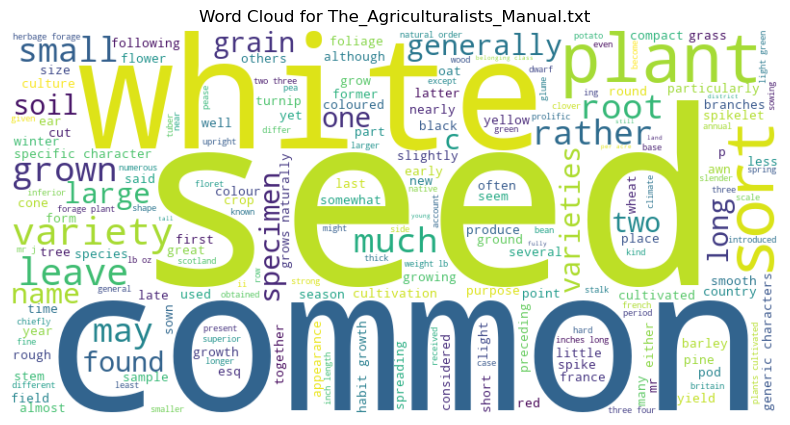

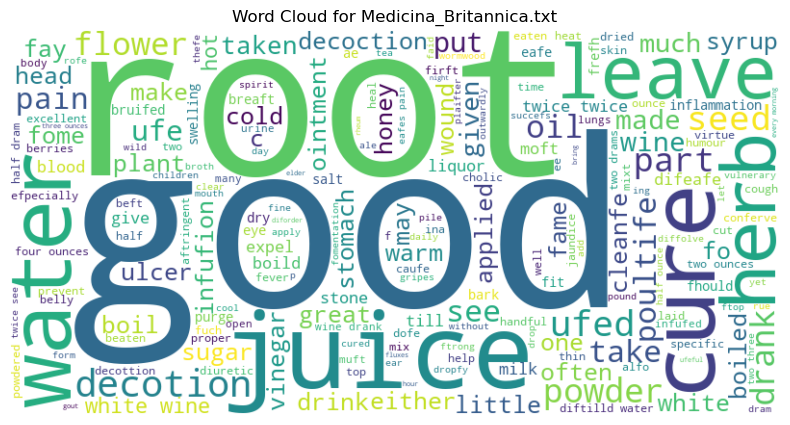

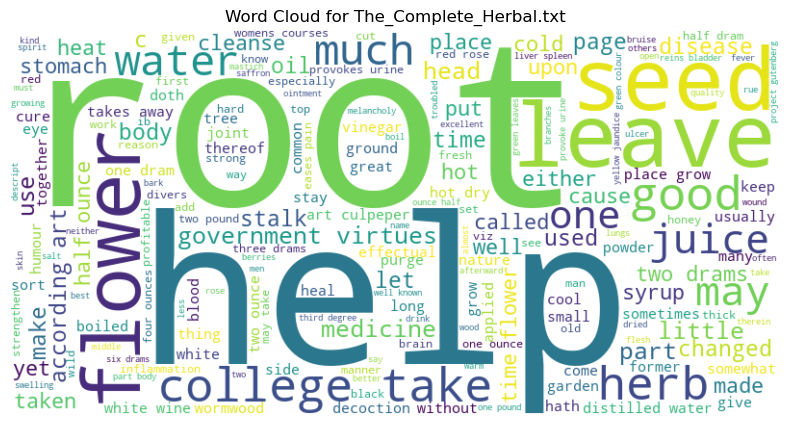

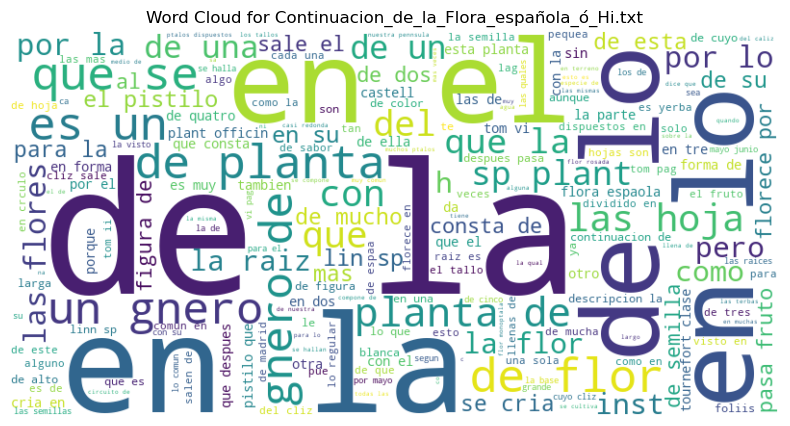

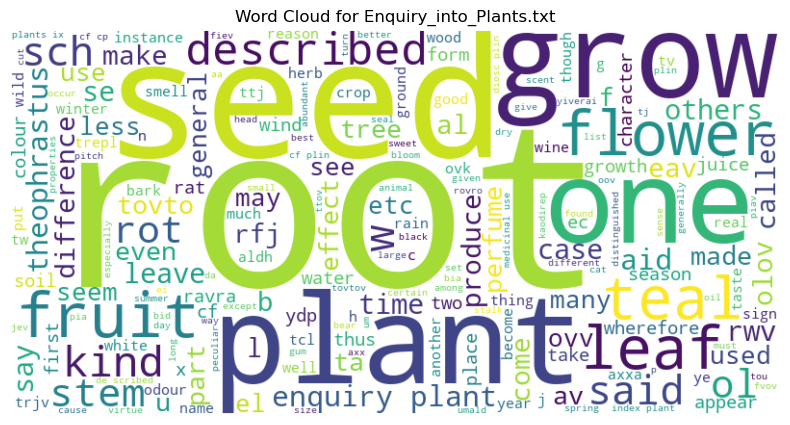

...

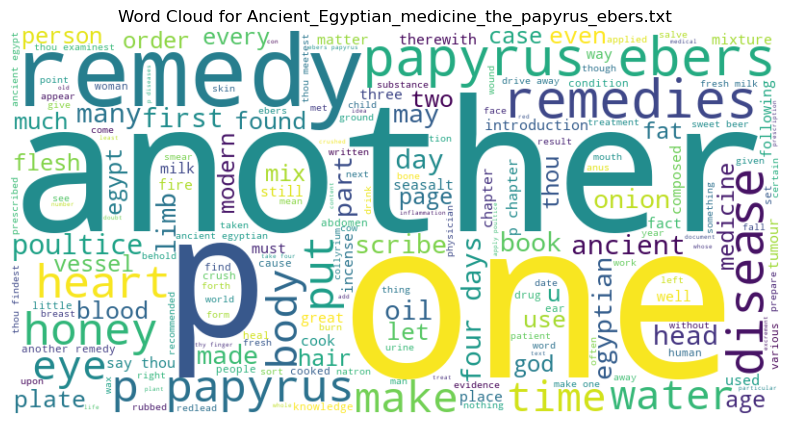

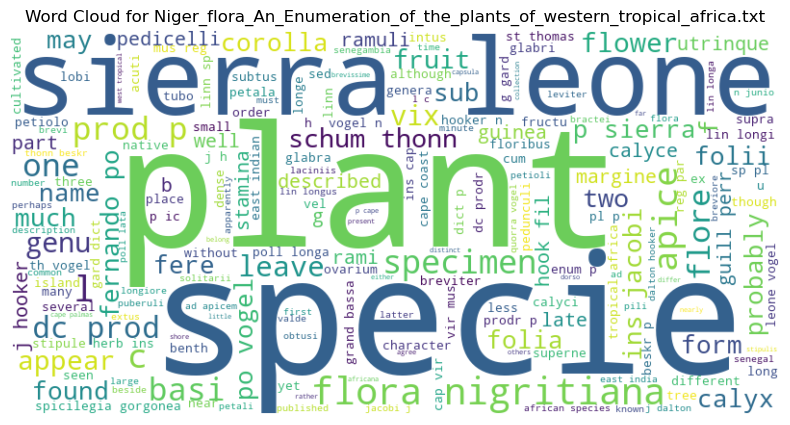

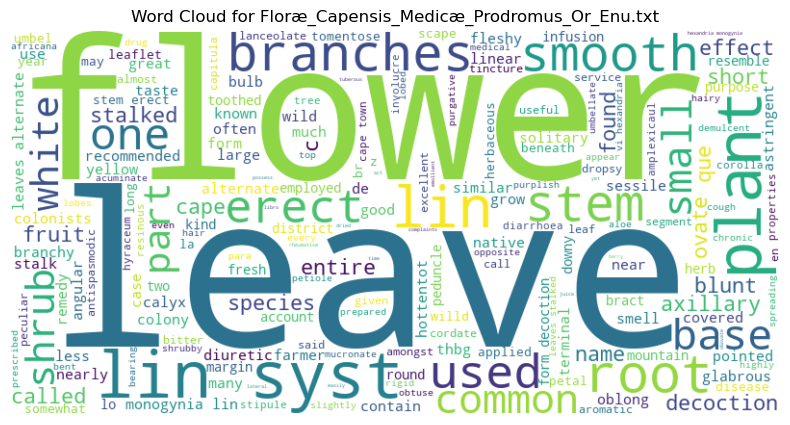

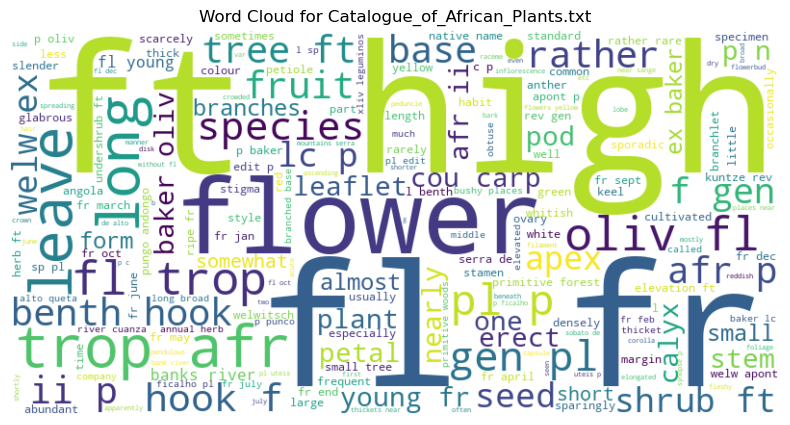

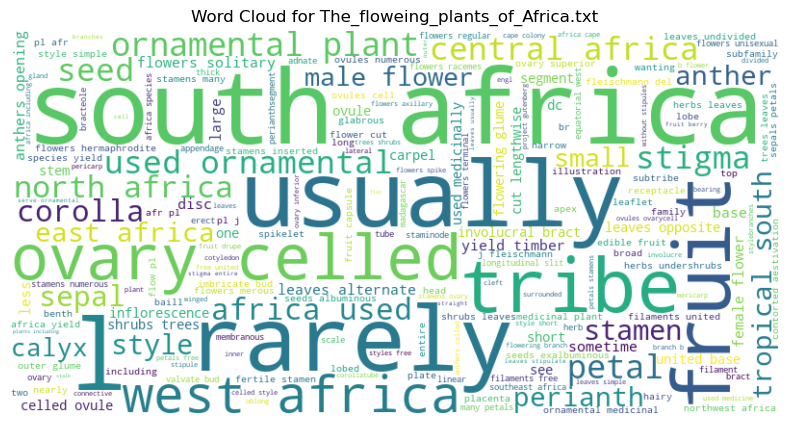

In [6]:
# remove basic stopwords and provide multiple cloud words, but allows you to customize stop words for characters that are difficult to remove
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd

# Custom list of words to be removed
custom_stop_words = ['twv', 'tov', 'koi', 'ov', "yap", "rrjv", "elvai", "rd", "kal", "cal", "ie", "ev", "ra", "comp", "e", "rj", "kara", "rb", "fjiev", "tt", "fcal", "rov", "conj", "edv", "ttjv", "v", "eei", "ti", "orav", "et"]  # Add more as needed

def clean_text(text):
    # Remove special characters, numbers, and punctuation
    cleaned_text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Tokenize the text
    tokens = word_tokenize(cleaned_text)

    # Convert to lowercase
    tokens = [word.lower() for word in tokens]

    # Remove stopwords and custom stop words
    stop_words = set(stopwords.words('english') + custom_stop_words)
    tokens = [word for word in tokens if word not in stop_words]

    # Join the tokens back into a single string
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

# Assuming metadata_df is a DataFrame with a 'content' column
# If it's not already, make sure 'content' is a string column
metadata_df['content'] = metadata_df['content'].astype(str)

# Create a new column for cleaned text in the DataFrame
metadata_df['cleaned_text'] = metadata_df['content'].apply(clean_text)

# Display one word cloud at a time
for index, row in metadata_df.iterrows():
    document_name = row['title']  # replace with the actual column name
    cleaned_text = row['cleaned_text']
    
    # Example: Create and display a word cloud for the current document
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for {document_name}")
    plt.axis('off')
    plt.show()
